#The Fast Fourier Transform and Frequency Filtering

Richell Flores

#Objectives

By the end of this notebook, students are expected to

- perform Fourier transform on images
- compress images with FFT
- perform highpass and lowpass filtering by transforming images to the frequency domain.

#Main References

Brunton and Kutz, Data Driven Science and Engineering, https://databookuw.com/databook.pdf

Brunton, Fourier Analysis (video series), https://www.youtube.com/watch?v=jNC0jxb0OxE&list=PLMrJAkhIeNNT_Xh3Oy0Y4LTj0Oxo8GqsC

OpenCV, Fourier Transform, https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_transforms/py_fourier_transform/py_fourier_transform.html

OpenAI, https://chatgpt.com/share/66fdef81-55f8-8008-b2aa-bbfba27c536e

# Required packages

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
from PIL import Image, ImageFilter, ImageOps, ImageChops, ImageColor, ImageCms, ImageEnhance

In [3]:
import numpy as np
import matplotlib.pyplot as plt

In [4]:
from scipy.fft import fft2, ifft2, fftshift, ifftshift

# Fast Fourier transform (FFT) on images

For now, we will be doing the Fourier transform for grayscale images.

We convert the image to grayscale by using `.convert('L')`.

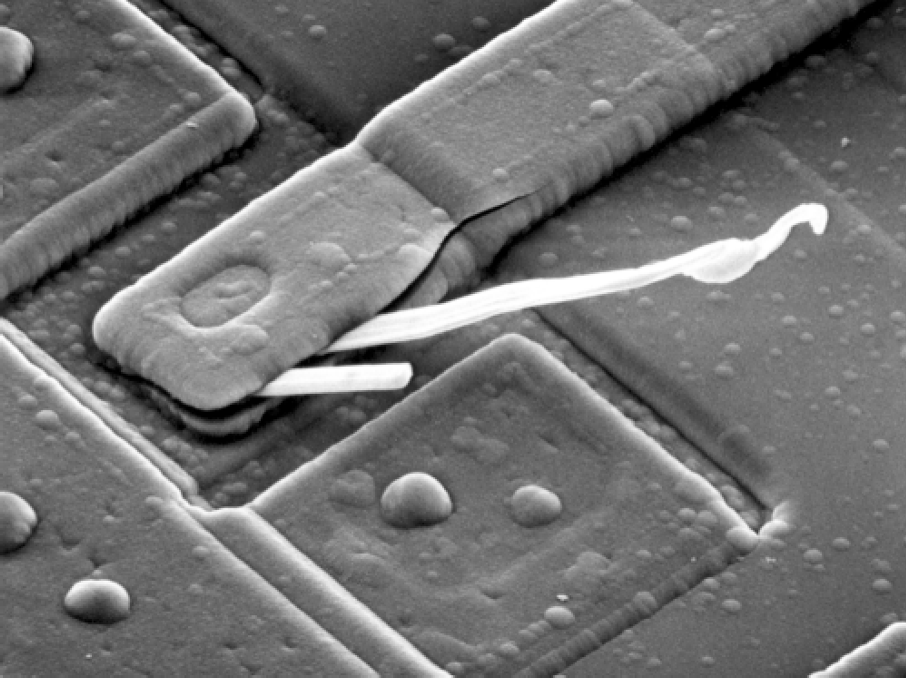

In [5]:
image = Image.open("/content/drive/MyDrive/Masters/Math 282.1 - Computer Vision/samples/sem.tif").convert('L')
image

Since we'll be using numpy and scipy to perform the FFT, we would need to convert our image into an array.

In [ ]:
gray_image = np.array(image)

We now apply FFT to the image, and then shifting the zero-component and other low-frequency components to the center. This way, the visualization becomes more intuitive.

We use the function `fft2` and `fftshift` from scipy.

In [ ]:
fft_image = fft2(gray_image)
shifted_fft = fftshift(fft_image)

We now obtain the Fourier spectrum and the phase spectrum of the image.

In [ ]:
magnitude_spectrum = 20*np.log(np.abs(shifted_fft) + 1)  # Logarithmic scale for better visualization
phase_spectrum = np.angle(shifted_fft)                # Phase spectrum

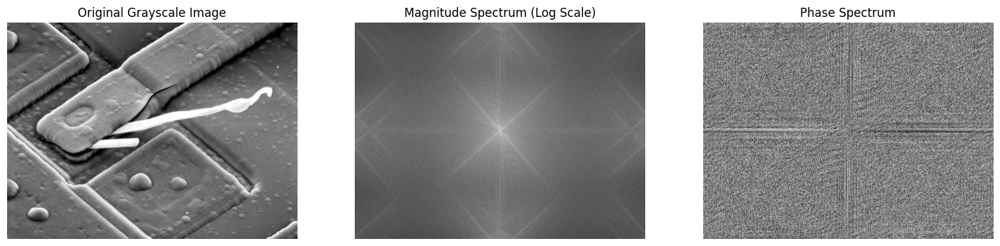

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Original Image
ax1.imshow(gray_image, cmap='gray')
ax1.set_title("Original Grayscale Image")
ax1.axis('off')

# Magnitude Spectrum
ax2.imshow(magnitude_spectrum, cmap='gray')
ax2.set_title("Magnitude Spectrum (Log Scale)")
ax2.axis('off')

# Phase Spectrum
ax3.imshow(phase_spectrum, cmap='gray')
ax3.set_title("Phase Spectrum")
ax3.axis('off')

plt.show()

In [ ]:
ifft_shifted = ifftshift(shifted_fft)
reconstructed_image = ifft2(ifft_shifted)
reconstructed_image = np.abs(reconstructed_image)  # Take the magnitude for display

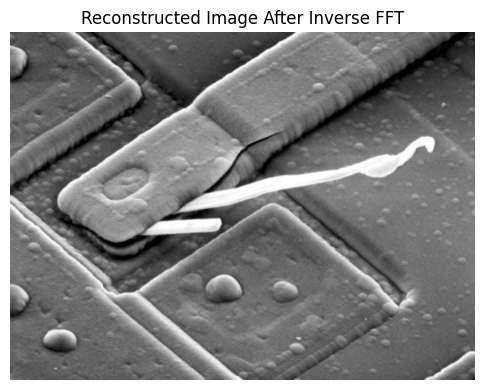

In [ ]:
plt.figure(figsize=(6, 6))
plt.imshow(reconstructed_image, cmap='gray')
plt.title("Reconstructed Image After Inverse FFT")
plt.axis('off')
plt.show()

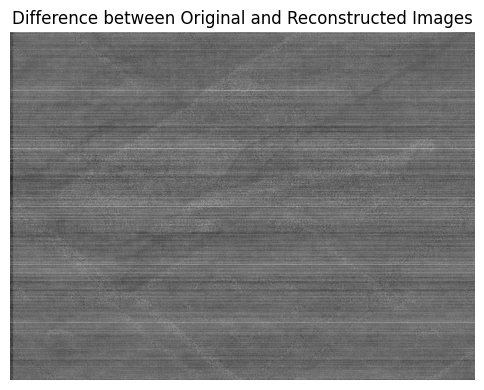

Mean Squared Error (MSE): 3.64478574013945e-27
Peak Signal-to-Noise Ratio (PSNR): 312.5140835759941


In [ ]:
# prompt: check for difference in original image and reconstructed image

import matplotlib.pyplot as plt
import numpy as np
# Calculate the difference between the original and reconstructed images
difference = gray_image - reconstructed_image

# Display the difference image
plt.figure(figsize=(6, 6))
plt.imshow(difference, cmap='gray')
plt.title("Difference between Original and Reconstructed Images")
plt.axis('off')
plt.show()

# Calculate the mean squared error (MSE)
mse = np.mean((gray_image - reconstructed_image)**2)
print(f"Mean Squared Error (MSE): {mse}")

# Calculate the peak signal-to-noise ratio (PSNR)
max_pixel_value = 255  # Assuming 8-bit grayscale image
psnr = 20 * np.log10(max_pixel_value / np.sqrt(mse))
print(f"Peak Signal-to-Noise Ratio (PSNR): {psnr}")


# Filtering in the frequency domain

OpenCV provides a good intuitive explanation on how to think of high- and low- frequencies in images.

> Where does the amplitude [think: intensity] varies drastically in images? At the edge points, or noises. So we can say, edges and noises are high frequency contents in an image. If there is no much changes in amplitude, it is a low frequency component.




Given a (padded) digital image, $f(x, y)$, of size
$P \times Q$ pixels, the basic filtering equation in which we are interested has the form:

$$ g(x, y) = \mathcal{R} \left( \mathcal{F}^{-1}\left\{H(u,v)\; F(u,v) \right\} \right) $$

where:

- $\mathcal{F}^{-1}$ is the inverse DFT
- $F(u, v)$ is the DFT of the image
- $H(u, v)$ is the *filter transfer function*
- $g(x, y)$ is the filtered (output) image
- $F$, $H$, and $g$ are arrays of size $P\times Q$

$H(u,v)$ will vary from filter to filter.

Note also that highpass filters are precisely the reverse of lowpass filters, so: $$ H_\text{HP}(u, v) = 1 - H_\text{LP}(u, v) $$

In [ ]:
def frequency_filtering(image, filter_function, **filter_params):
    """
    Applies frequency domain filtering to a given image using a specified filter.

    Args:
        image: 2D numpy array of the grayscale image.
        filter_function: A function that defines H(u, v) for the given image size.
        filter_params: Additional parameters for the filter function.

    Returns:
        filtered_image: The filtered image in the spatial domain.
        magnitude_spectrum: The magnitude spectrum of the filtered image.
        phase_spectrum: The phase spectrum of the filtered image.
    """
    P, Q = image.shape  # Get image dimensions

    image = image/255.0

    # Compute the DFT of the Image (F(u, v))
    F = fft2(image, s=(P, Q))  # Ensure the FFT size matches image dimensions
    F_shifted = fftshift(F)    # Shift zero-frequency component to the center

    # Compute the Filter Transfer Function H(u, v)
    H = filter_function(P, Q, **filter_params)

    # Apply the filter in the frequency domain
    G_shifted = H * F_shifted  # Element-wise multiplication H(u, v) * F(u, v)

    # Extract the Magnitude and Phase Spectrum
    magnitude_spectrum = np.abs(G_shifted)       # Magnitude Spectrum |G(u, v)|
    phase_spectrum = np.angle(G_shifted)         # Phase Spectrum

    # Compute the Inverse DFT to get the filtered image
    G = ifftshift(G_shifted)   # Inverse shift
    g = np.abs(ifft2(G))       # Inverse FFT and take the real part

    return g, magnitude_spectrum, phase_spectrum

In [ ]:
def apply_filter(image, filter_function, filter_type=None):
    """
    Helper function to apply a frequency domain filter and display results.

    Args:
        image_path: Path to the input image.
        filter_function: Function defining the filter to be applied.
        filter_type: Type of filter ('lowpass' or 'highpass').

    """
    # Step 1: Load the image
    gray_image = np.array(image)

    # Step 2: Ask the user for necessary inputs based on the filter type
    if filter_function in [ideal_filter, butterworth_filter, gaussian_filter]:
        cutoff_radius = int(input(f"Enter the cutoff frequency (radius) for the {filter_type} filter: "))
        if filter_function == butterworth_filter:
            n = int(input("Enter the order of the Butterworth filter: "))
            filter_params = {'cutoff_radius': cutoff_radius, 'n': n, 'filter_type': filter_type}
        else:
            filter_params = {'cutoff_radius': cutoff_radius, 'filter_type': filter_type}
    if filter_function == laplacian_filter:
        filter_params = {}

    # Step 3: Apply the specified filter
    filtered_image, magnitude_spectrum, phase_spectrum = frequency_filtering(
        gray_image, filter_function, **filter_params
    )

    if filter_function == laplacian_filter:
        max_value = np.max(np.abs(filtered_image))  # Find maximum value
        filtered_image = filtered_image / max_value  # Normalize the Laplacian result
        filtered_image = np.clip(filtered_image, -1, 1)  # Clip to [-1, 1]

    return filtered_image, magnitude_spectrum, phase_spectrum

In [ ]:
def display_filter(image, filtered_image, magnitude_spectrum, phase_spectrum):
    # Step 4: Display the results
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 12))

    # Original Image
    ax1.imshow(gray_image, cmap='gray')
    ax1.set_title("Original Grayscale Image")
    ax1.axis('off')

    # Magnitude Spectrum Before Applying the Filter
    ax2.imshow(np.log(magnitude_spectrum + 1), cmap='gray')  # Log scale for better visualization
    ax2.set_title("Magnitude Spectrum (Filtered)")
    ax2.axis('off')

    # Phase Spectrum Before Applying the Filter
    ax3.imshow(phase_spectrum, cmap='gray')
    ax3.set_title("Phase Spectrum (Filtered)")
    ax3.axis('off')

    # Filtered Image After Applying Filter
    ax4.imshow(filtered_image, cmap='gray')
    ax4.set_title(f"Filtered Image")
    ax4.axis('off')

    plt.tight_layout()
    plt.show()

## Ideal filter

**Main Idea:** Simply cut off all high frequency components that are a specified distance $D_0$ from the origin of the transform.

In [ ]:
def ideal_filter(P, Q, cutoff_radius, filter_type='lowpass'):
    """
    Creates an ideal low-pass or high-pass filter transfer function H(u, v) of size P x Q.

    Args:
        P: Number of rows in the filter (height of the image).
        Q: Number of columns in the filter (width of the image).
        cutoff_radius: The cutoff frequency (radius in the frequency domain).
        filter_type: Type of filter ('lowpass' or 'highpass').

    Returns:
        H: A 2D array representing the ideal filter transfer function.
    """
    H = np.zeros((P, Q))
    center_u, center_v = P // 2, Q // 2  # Center of the frequency domain

    for u in range(P):
        for v in range(Q):
            D = np.sqrt((u - center_u) ** 2 + (v - center_v) ** 2)
            if filter_type == 'lowpass':
                H[u, v] = 1 if D <= cutoff_radius else 0  # Pass low frequencies
            elif filter_type == 'highpass':
                H[u, v] = 0 if D <= cutoff_radius else 1  # Pass high frequencies
    return H

In [ ]:
ideal_filter(5,5,1,'lowpass')

array([[0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 1., 1., 1., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [ ]:
ideal_filter(5,5,1,'highpass')

array([[1., 1., 1., 1., 1.],
       [1., 1., 0., 1., 1.],
       [1., 0., 0., 0., 1.],
       [1., 1., 0., 1., 1.],
       [1., 1., 1., 1., 1.]])

In [ ]:
image_ilpf, ms_ilpf, ps_ilpf = apply_filter(image, ideal_filter, 'lowpass')

Enter the cutoff frequency (radius) for the lowpass filter: 50


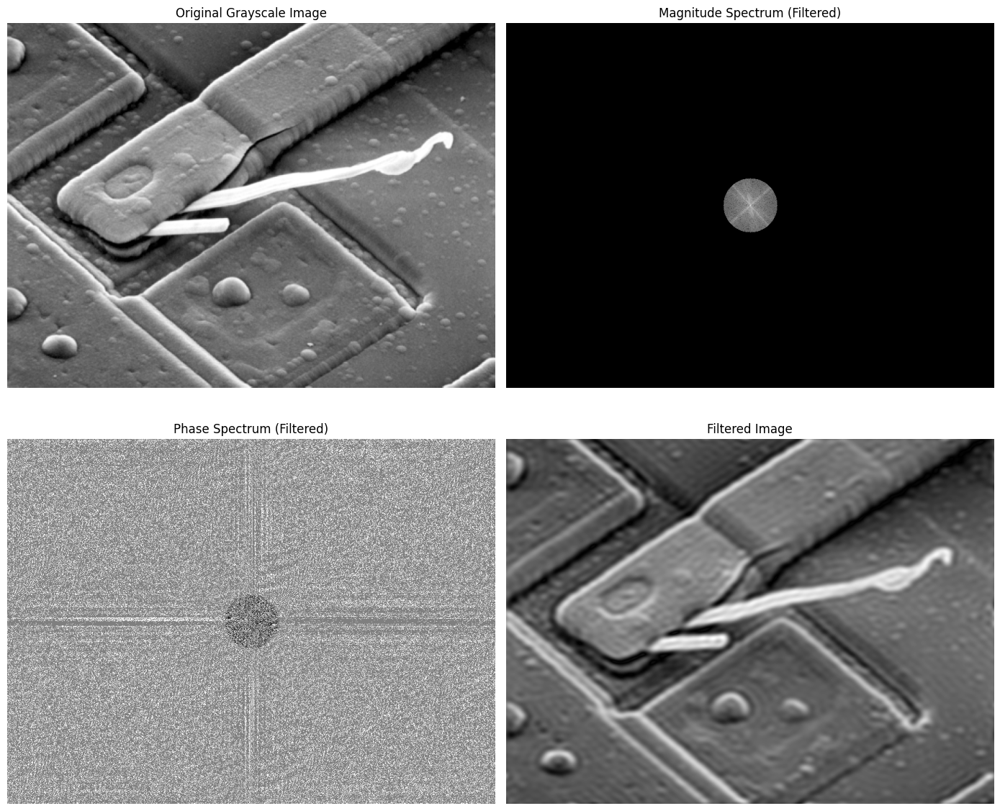

In [ ]:
display_filter(image, image_ilpf, ms_ilpf, ps_ilpf)

In [ ]:
image_ihpf, ms_ihpf, ps_ihpf = apply_filter(image, ideal_filter, 'highpass')

Enter the cutoff frequency (radius) for the highpass filter: 5


In [ ]:
display_filter(image, image_ihpf, ms_ihpf, ps_ihpf)

Output hidden; open in https://colab.research.google.com to view.

**Task:** Comment on the resulting filtered image. What artifacts on the image can you observe? Are they desirable?

## Butterworth filter

The transfer function of a Butterworth lowpass filter of order $n$ with cutoff
frequency at distance $D_0$ from the origin is defined as:
$$ H(u, v) = \frac{1}{1 + \left(\frac{D(u,v)}{D_0}\right)^{2n}}. $$

In [ ]:
def butterworth_filter(P, Q, cutoff_radius, n, filter_type='lowpass'):
    """
    Creates a Butterworth low-pass or high-pass filter transfer function H(u, v) of size P x Q.

    Args:
        P: Number of rows in the filter (height of the image).
        Q: Number of columns in the filter (width of the image).
        cutoff_radius: The cutoff frequency (radius in the frequency domain).
        n: Order of the Butterworth filter.
        filter_type: Type of filter ('lowpass' or 'highpass').

    Returns:
        H: A 2D array representing the Butterworth filter transfer function.
    """
    H = np.zeros((P, Q))
    center_u, center_v = P // 2, Q // 2  # Center of the frequency domain

    for u in range(P):
        for v in range(Q):
            D = np.sqrt((u - center_u) ** 2 + (v - center_v) ** 2)  # Distance from center
            if filter_type == 'lowpass':
                H[u, v] = 1 / (1 + (D / cutoff_radius) ** (2 * n))  # Lowpass Butterworth formula
            elif filter_type == 'highpass':
                if D == 0:
                    H[u, v] = 0
                else:
                    H[u, v] = 1 / (1 + (cutoff_radius / D) ** (2 * n))  # Highpass Butterworth formula
    return H

In [ ]:
butterworth_filter(5,5,1,1,'lowpass')

array([[0.11111111, 0.16666667, 0.2       , 0.16666667, 0.11111111],
       [0.16666667, 0.33333333, 0.5       , 0.33333333, 0.16666667],
       [0.2       , 0.5       , 1.        , 0.5       , 0.2       ],
       [0.16666667, 0.33333333, 0.5       , 0.33333333, 0.16666667],
       [0.11111111, 0.16666667, 0.2       , 0.16666667, 0.11111111]])

In [ ]:
image_blpf, ms_blpf, ps_blpf = apply_filter(image, butterworth_filter, 'lowpass')

Enter the cutoff frequency (radius) for the lowpass filter: 20
Enter the order of the Butterworth filter: 20


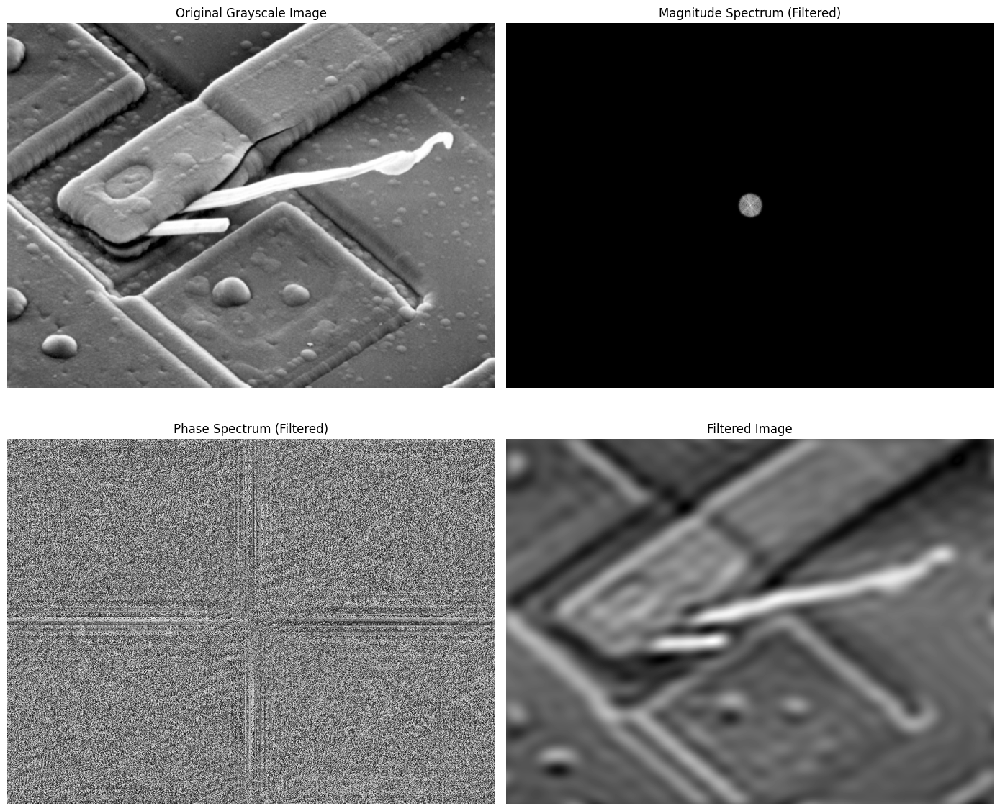

In [ ]:
display_filter(image, image_blpf, ms_blpf, ps_blpf)

Compare the results of the ideal lowpass filter with that of the Butterworth lowpass filter.

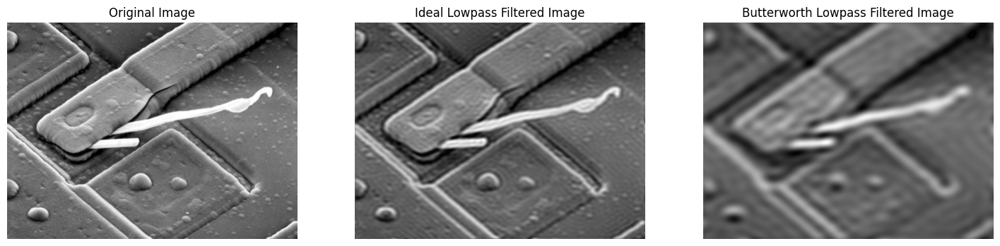

In [ ]:
# prompt: display image, image_ilpf and image_blpf side by side

import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original Image
axes[0].imshow(np.array(image), cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

# Ideal Lowpass Filtered Image
axes[1].imshow(image_ilpf, cmap='gray')
axes[1].set_title("Ideal Lowpass Filtered Image")
axes[1].axis('off')

# Butterworth Lowpass Filtered Image
axes[2].imshow(image_blpf, cmap='gray')
axes[2].set_title("Butterworth Lowpass Filtered Image")
axes[2].axis('off')

plt.show()


**Task**: Investigate the implementation of the Butterworth highpass filter. Does it make sense to assign $0$ when $D=0$?

In [ ]:
image_bhpf, ms_bhpf, ps_bhpf = apply_filter(image, butterworth_filter, 'highpass')

Enter the cutoff frequency (radius) for the highpass filter: 10
Enter the order of the Butterworth filter: 10


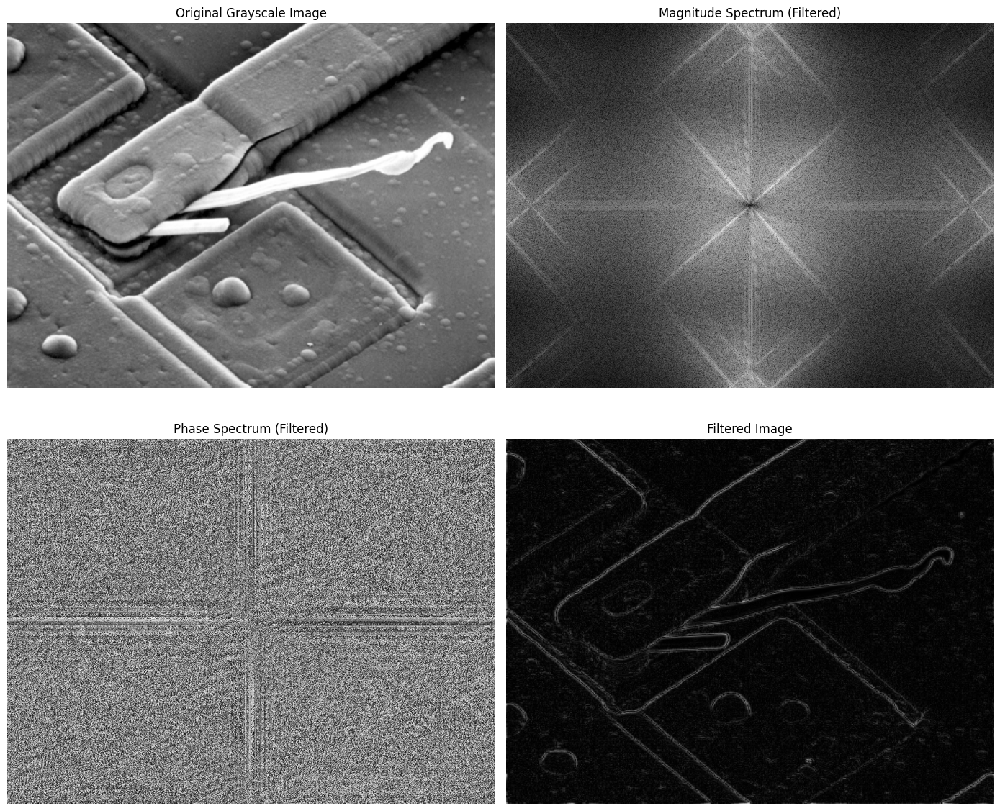

In [ ]:
display_filter(image, image_bhpf, ms_bhpf, ps_bhpf)

**Task**: Create (or modify) a function to investigate the effect of increasing the order of the Butterworth filter for lowpass and highpass filtering.

In [ ]:
def apply_butterworth_auto(image, filter_function, filter_type, cutoff_radius, n):
    """
    Helper function to apply a frequency domain filter and display results.

    Args:
        image_path: Path to the input image.
        filter_function: Function defining the filter to be applied.
        filter_type: Type of filter ('lowpass' or 'highpass').

    """
    # Step 1: Load the image
    gray_image = np.array(image)


    filter_params = {'cutoff_radius': cutoff_radius, 'n': n, 'filter_type': filter_type}

    # Step 3: Apply the specified filter
    filtered_image, magnitude_spectrum, phase_spectrum = frequency_filtering(
        gray_image, filter_function, **filter_params
    )

    return filtered_image, magnitude_spectrum, phase_spectrum

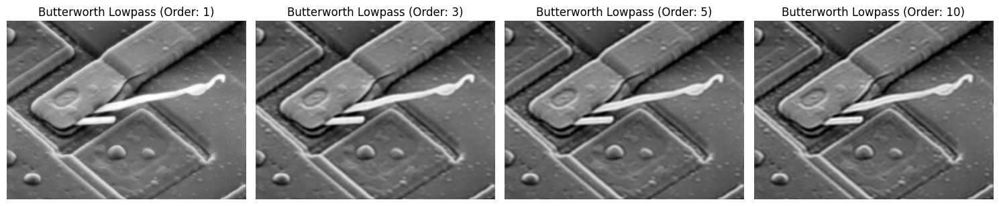

In [ ]:
# prompt: use apply_butterworth_auto to check the effect of varying the order of the filter. display side by side

import matplotlib.pyplot as plt

# Assuming 'image' is your grayscale image as a NumPy array
cutoff_radius = 50  # Example cutoff radius
orders = [1, 3, 5, 10]  # Example filter orders to test

fig, axes = plt.subplots(1, len(orders), figsize=(15, 5))

for i, order in enumerate(orders):
    filtered_image, _, _ = apply_butterworth_auto(image, butterworth_filter, 'lowpass', cutoff_radius, order)
    axes[i].imshow(filtered_image, cmap='gray')
    axes[i].set_title(f"Butterworth Lowpass (Order: {order})")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## Gaussian filter

In [ ]:
def gaussian_filter(P, Q, cutoff_radius, filter_type='lowpass'):
    """
    Creates a Gaussian low-pass or high-pass filter transfer function H(u, v) of size P x Q.

    Args:
        P: Number of rows in the filter (height of the image).
        Q: Number of columns in the filter (width of the image).
        cutoff_radius: The cutoff frequency (radius in the frequency domain).
        filter_type: Type of filter ('lowpass' or 'highpass').

    Returns:
        H: A 2D array representing the Gaussian filter transfer function.
    """
    H = np.zeros((P, Q))
    center_u, center_v = P // 2, Q // 2  # Center of the frequency domain

    for u in range(P):
        for v in range(Q):
            D = np.sqrt((u - center_u) ** 2 + (v - center_v) ** 2)
            if filter_type == 'lowpass':
                H[u, v] = np.exp(-(D ** 2) / (2 * (cutoff_radius ** 2)))  # Lowpass Gaussian
            elif filter_type == 'highpass':
                H[u, v] = 1 - np.exp(-(D ** 2) / (2 * (cutoff_radius ** 2)))  # Highpass Gaussian
    return H

In [ ]:
image_glpf, ms_glpf, ps_glpf = apply_filter(image, gaussian_filter, 'lowpass')

Enter the cutoff frequency (radius) for the lowpass filter: 10


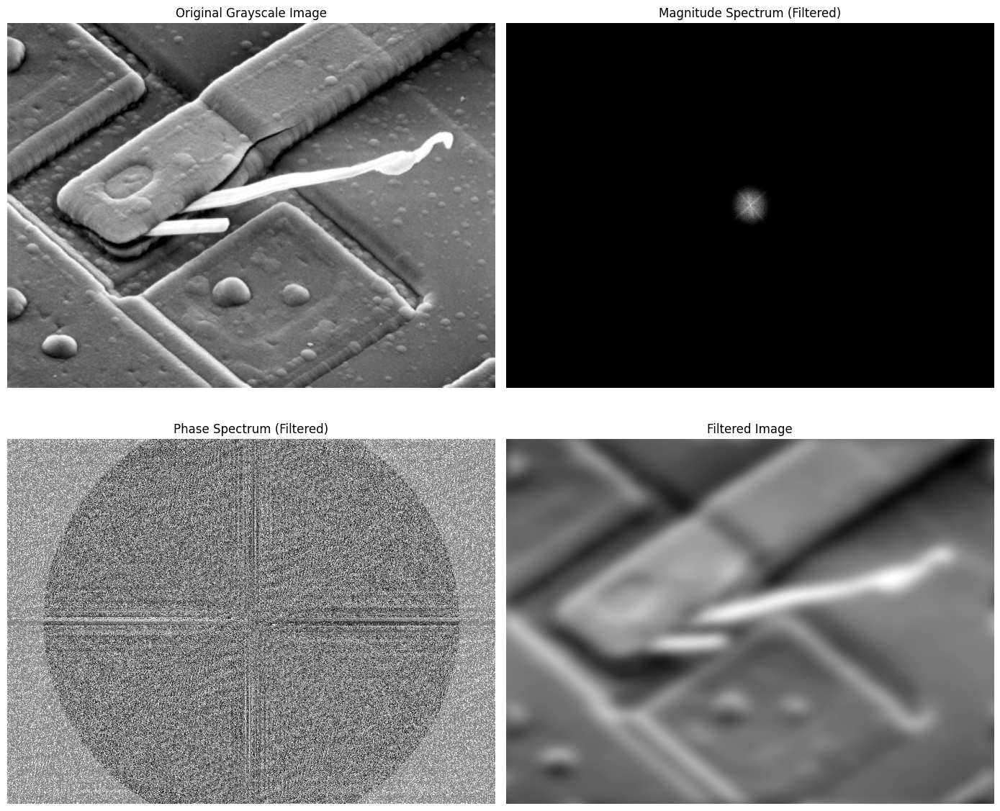

In [ ]:
display_filter(image, image_glpf, ms_glpf, ps_glpf)

## Laplacian filter

It can be shown that the Laplacian can be implemented in the frequency domain using the filter transfer function

 $$ H(u, v) = -4\pi^2 (u^2+v^2) $$

or, with respect to the center of the frequency rectangle, using the transfer function

\begin{align}
H(u,v) &= -4\pi^2 \left[(u-P/2)^2 + (v-Q/2)^2\right] \\
&= -4\pi^2D^2(u,v)
\end{align}


Using this transfer function, the Laplacian of an image, $\nabla^2 f(x, y)$, is obtained in the familiar manner:

$$ \nabla^2 f(x, y) = \mathcal{F}^{-1} \left\{H(u,v)\; F(u,v) \right\} $$

where $F(u,v)$ is the DFT of $f(x,y)$.

In [ ]:
def laplacian_filter(P, Q):
    """
    Creates a Laplacian filter transfer function H(u, v) of size P x Q.

    Args:
        P: Number of rows in the filter (height of the image).
        Q: Number of columns in the filter (width of the image).

    Returns:
        H: A 2D array representing the Laplacian filter transfer function.
    """
    H = np.zeros((P, Q))
    center_u, center_v = P // 2, Q // 2  # Center of the frequency domain

    for u in range(P):
        for v in range(Q):
            D = np.sqrt((u - center_u) ** 2 + (v - center_v) ** 2)  # Distance from center
            H[u, v] = -4 * np.pi**2 * (D**2)  # Laplacian filter formula
    return H

To perform sharpening, we still use $$g(x,y) = f(x,y) + c∇^2f(x,y).$$

with $c=-1$ since our $H(u,v)$ is negative.

In [ ]:
image_nabla, ms_laplacian, ps_laplacian = apply_filter(image, laplacian_filter)

In [ ]:
display_filter(image, image_nabla, ms_laplacian, ps_laplacian)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def sharpen_image(original_image, filtered_image):
    """
    Sharpened the image.

    Args:
        original_image: The original input image (2D array) [0,1].
        filtered_image: The filtered image (2D array).
    """
    # Step 1: Calculate the sharpened image
    sharpened_image = (original_image - filtered_image) * 255.0  # Sharpening the image
    sharpened_image = np.clip(sharpened_image, 0, 255)  # Ensure values are within 0-255
    sharpened_image = Image.fromarray(sharpened_image.astype(np.uint8))  # Convert to PIL Image

    # Step 2: Display the sharpened image using Pillow
    return sharpened_image

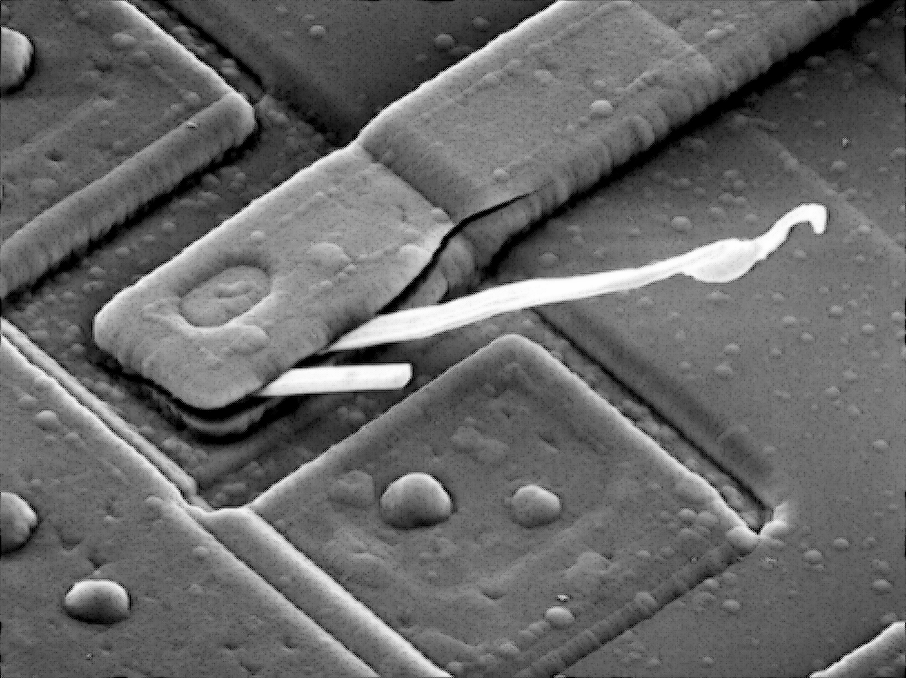

In [ ]:
image_sharpened = sharpen_image(np.array(image)/255.0, image_nabla)
image_sharpened

# Exercises

## Thumbprint

Consider the following image of a thumbprint. Use what you have learned so far in image processing to enhance the image.

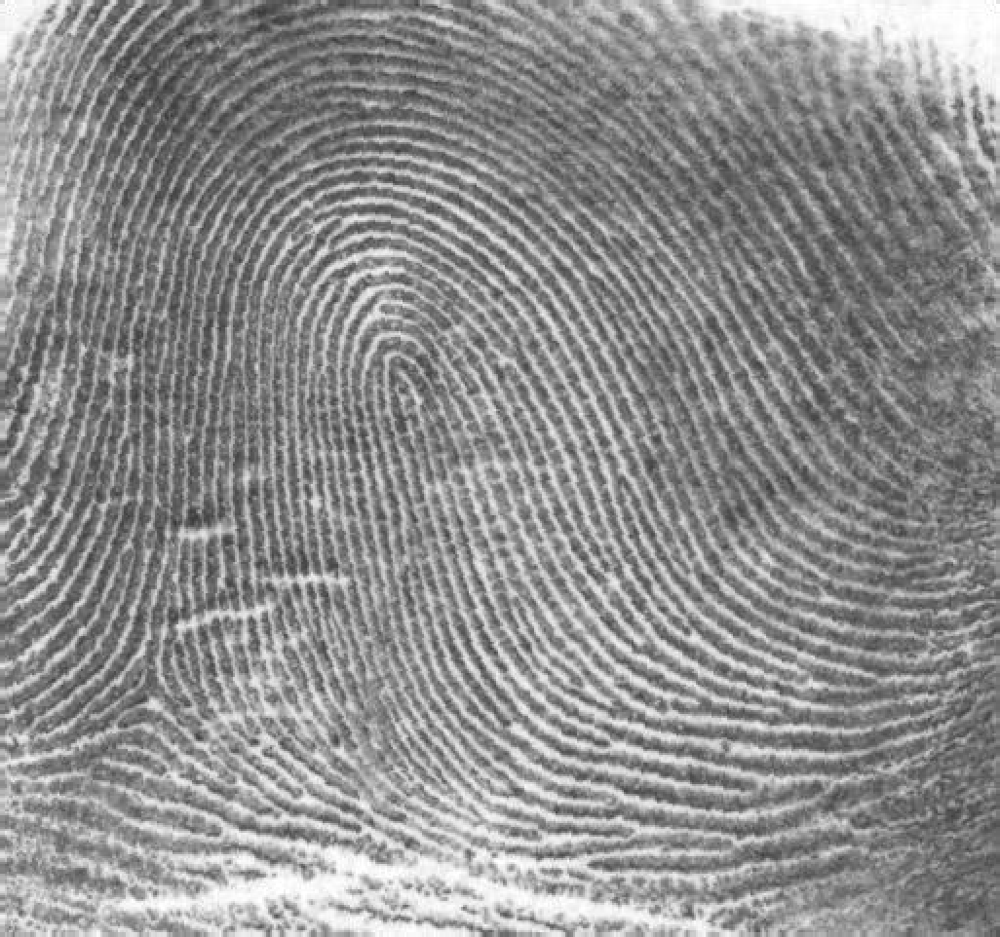

In [ ]:
thumbprint = Image.open('/content/drive/MyDrive/2024-2025/1 MATH 282.1/samples/thumbprint.tif')
thumbprint

In [ ]:
# insert code here

## OCR Preprocessing

Preprocess the following image in preparation for an optical character recognition.

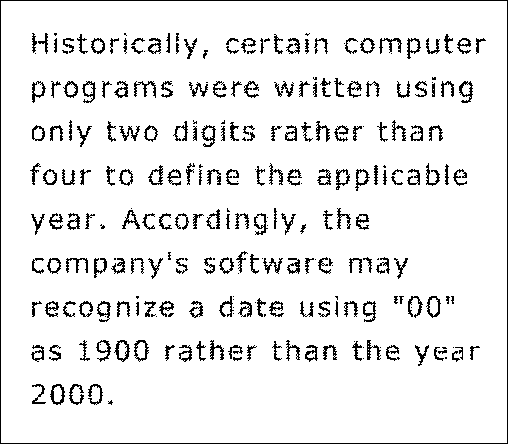

In [ ]:
text = Image.open('/content/drive/MyDrive/2024-2025/1 MATH 282.1/samples/text.tif')
text

In [ ]:
# insert code here